# Imports & file locations

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
scanpy==1.4.6.dev9+ge632939 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.22 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


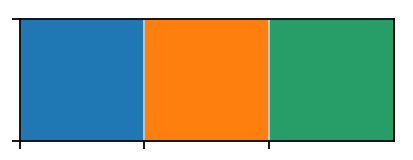

In [ ]:
%load_ext autoreload
%autoreload 2

import itertools

import numpy as np
import scanpy 
import scanpy as sc
import scipy
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from sklearn.metrics import normalized_mutual_info_score

import anndata

# Joblib for parallelizing
from joblib import Parallel, delayed 

pd.options.display.max_columns = 100

import binarized

anndata.__version__

scanpy.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
scanpy.logging.print_versions()
scanpy.set_figure_params(frameon=False, color_map='magma_r')

In [ ]:
SPECIES_ORDER = ['Mouse', 'Mouse lemur', 'Human']
N_SPECIES = len(SPECIES_ORDER)
SPECIES_PALETTE = sns.color_palette(n_colors=N_SPECIES)
sns.palplot(SPECIES_PALETTE)

ax = plt.gca()
ax.set(xticklabels=SPECIES_ORDER, xticks=np.arange(N_SPECIES));

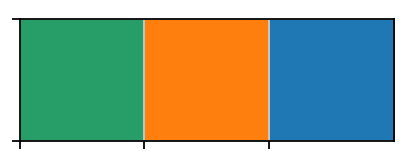

In [83]:
species_palette_human_first = SPECIES_PALETTE[::-1]
sns.palplot(species_palette_human_first)

In [84]:
outdir_gdrive = '/home/olga/googledrive/TabulaMicrocebus/data/cross-species'
outdir_local = '/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species'
outdirs = outdir_local, outdir_gdrive
!ls -lha $outdir_local

total 35G
drwxrwxr-x 12 olga czb  4.0K May 14 12:47 .
drwxrwxr-x  7 olga czb  4.0K May  7 15:55 ..
drwxrwxr-x  3 olga czb  4.0K Mar 21 21:55 alltissues__10x__lemur__one2one_orthologs__csvs
-rw-rw-r--  1 olga czb  2.1G May 18 15:07 alltissues__10x__lemur__one2one_orthologs.h5ad
drwxrwxr-x  3 olga czb  4.0K Mar 21 16:49 alltissues__10x__mouse__one2one_orthologs__csvs
-rw-rw-r--  1 olga czb  3.1G May 18 15:04 alltissues__10x__mouse__one2one_orthologs.h5ad
-rw-r--r--  1 olga czb   21K May 19 08:02 binarized_expression__stable_genes__compartment_primate_enriched.csv
-rw-r--r--  1 olga czb  1.1M May 19 07:19 binarized_gene_expression__stable_genes_by_mutual_information__fraction_per_compartment.csv
-rw-r--r--  1 olga czb  2.8M May 19 07:19 binarized_gene_expression__stable_genes_by_mutual_information__go_enrichment.csv
-rw-r--r--  1 olga czb   25K May 19 07:19 binarized_gene_expression__stable_genes_by_mutual_information.txt
-rw-r--r--  1 olga czb  2.2M May 19 07:20 binarized_gene_expression

# Load data

In [5]:
%%time
h5ad = f'{outdir_local}/concatenated__human-lung--lemur-lung--mouse-lung__10x__one2one_orthologs__unified_compartments__bbknn.h5ad'
adata = scanpy.read_h5ad(h5ad)
adata

CPU times: user 399 ms, sys: 575 ms, total: 974 ms
Wall time: 3.83 s


AnnData object with n_obs × n_vars = 52815 × 11761 
    obs: 'age', 'batch', 'cell', 'cell_barcode', 'cell_ontology_class', 'cell_ontology_id', 'channel', 'channel_no_10x', 'channel_tissue', 'compartment', 'compartment_id', 'free_annotation', 'individual', 'location', 'magnetic.selection', 'method', 'mouse.id', 'nGene', 'nUMI', 'n_barcodes', 'n_counts', 'n_genes', 'orig.ident', 'original_channel', 'patient', 'percent.ribo', 'possibly_contaminated_barcode', 'preparation.site', 'region', 'sample', 'sequencing_run', 'sex', 'species', 'species_batch', 'species_latin', 'subtissue', 'tissue', 'tissue_free_annotation', 'compartment_updated_from_human', 'compartment_updated_from_human__with_species', 'compartment_updated_from_lemur', 'compartment_updated_from_lemur__with_species', 'narrow_group', 'broad_group', 'compartment_group', 'log_counts', 'sqrt_counts'
    var: 'mouse_lemur__gene_name', 'mouse_lemur_to_human__homology_type', 'human_to_mouse__homology_type', 'mouse__gene_name', 'gene_ids

# Within-compartment, run stability analyses

/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-21 13:30:37,883 INFO: Computing fraction cells expressing genes per compartment_group
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-21 13:30:37,884 INFO: Filtering adata for only narrow_group shared across all 3 species
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-21 13:30:37,888 INFO: Starting number of narrow_group: 64
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-21 13:30:38,055 INFO: After removing groups not in all species narrow_group: 22
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-21 13:30:38,134 INFO: After cell groups with too few cells in compartment_group: 5
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-withi

(483615, 4)


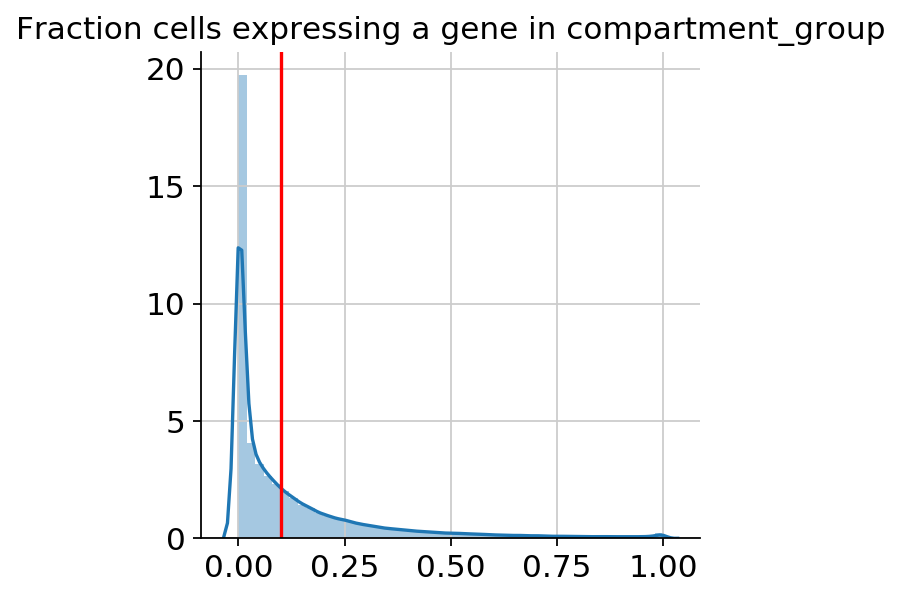

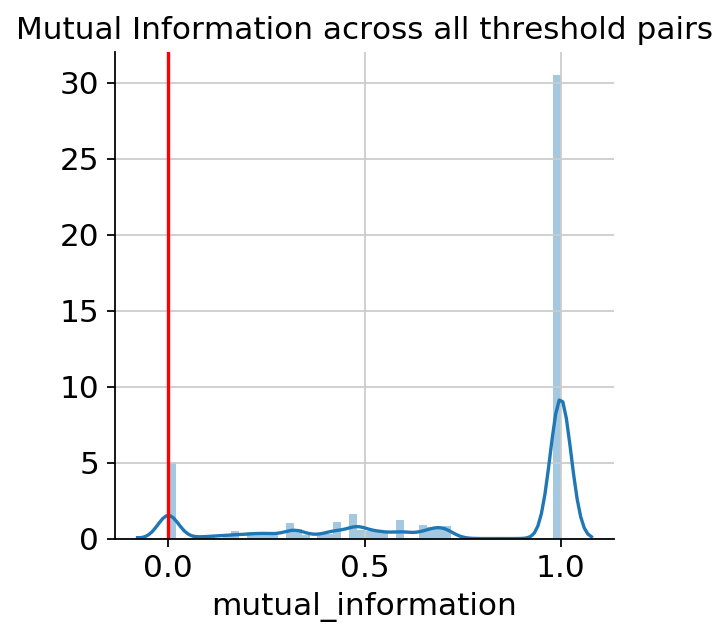

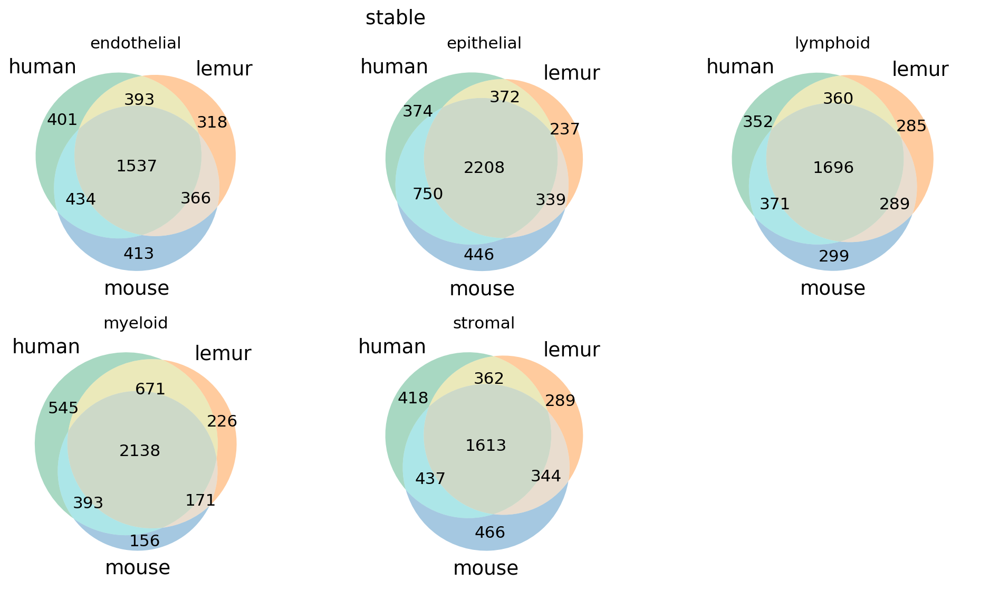

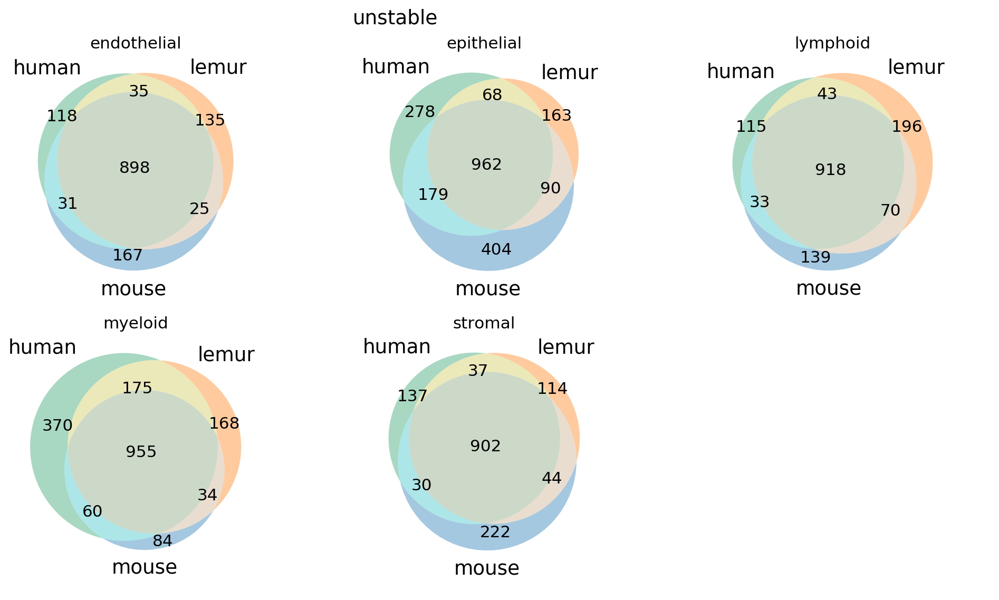

In [251]:
groupby = 'compartment_group'
species = 'species_batch'

compartment_stability = binarized.BinarizedStabilityAnalyses(adata, groupby, species, debug=True)
compartment_stability.do_stability_analysis()


In [252]:
compartment_stability.do_go_enrichment()

(82, 16)
(1330, 16)


## Plot enrichment, groupby source

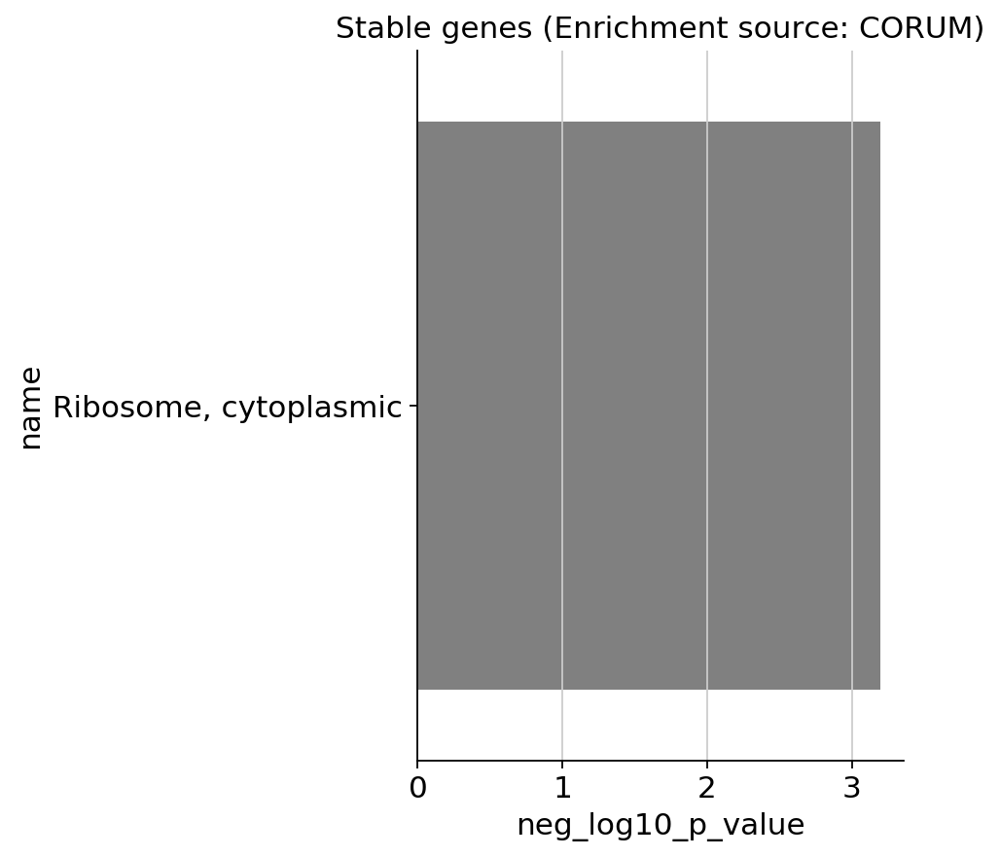

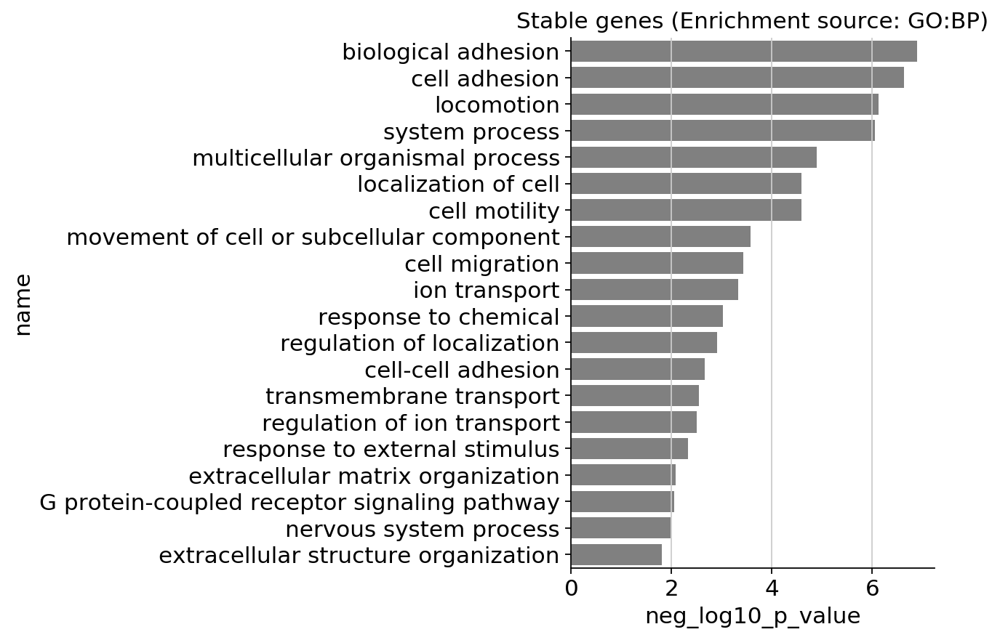

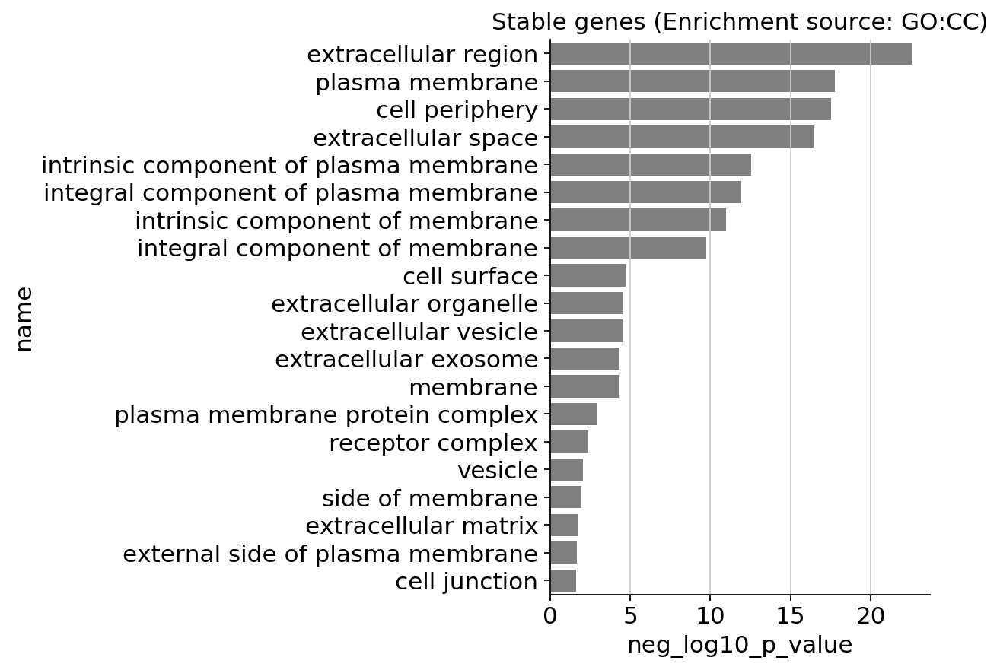

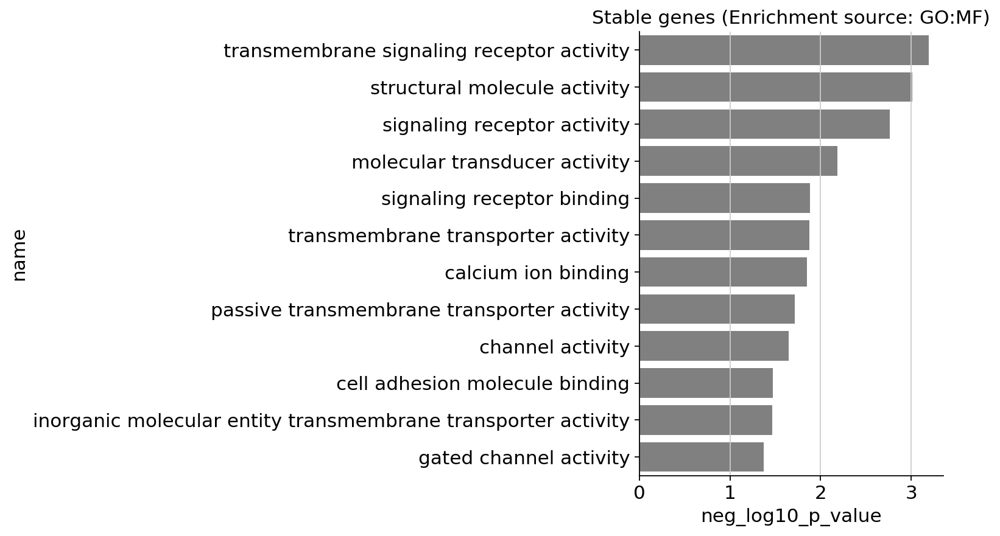

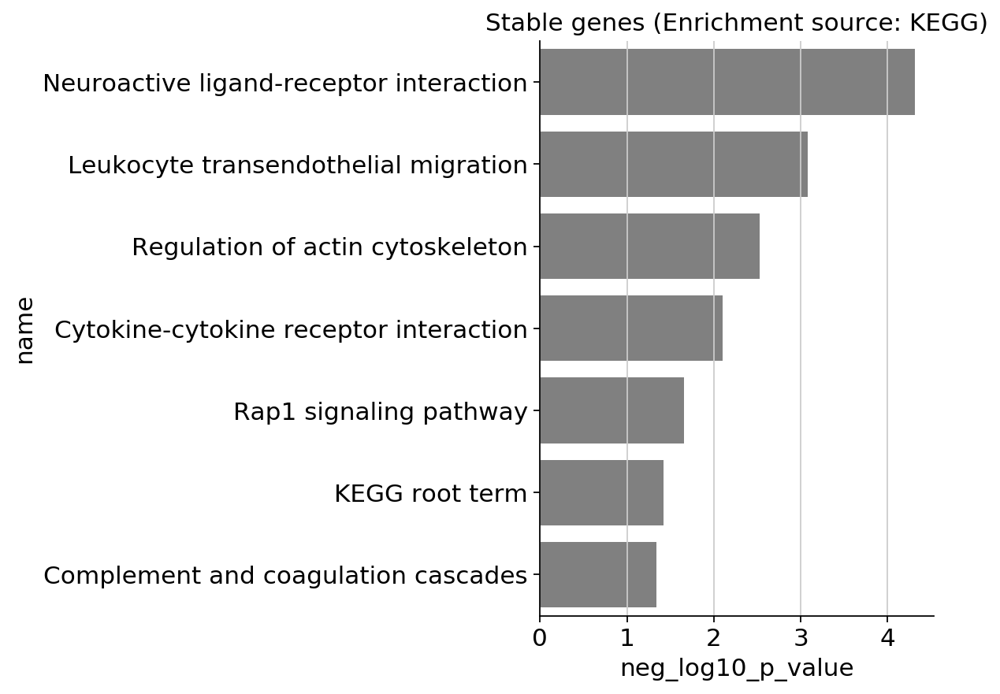

...

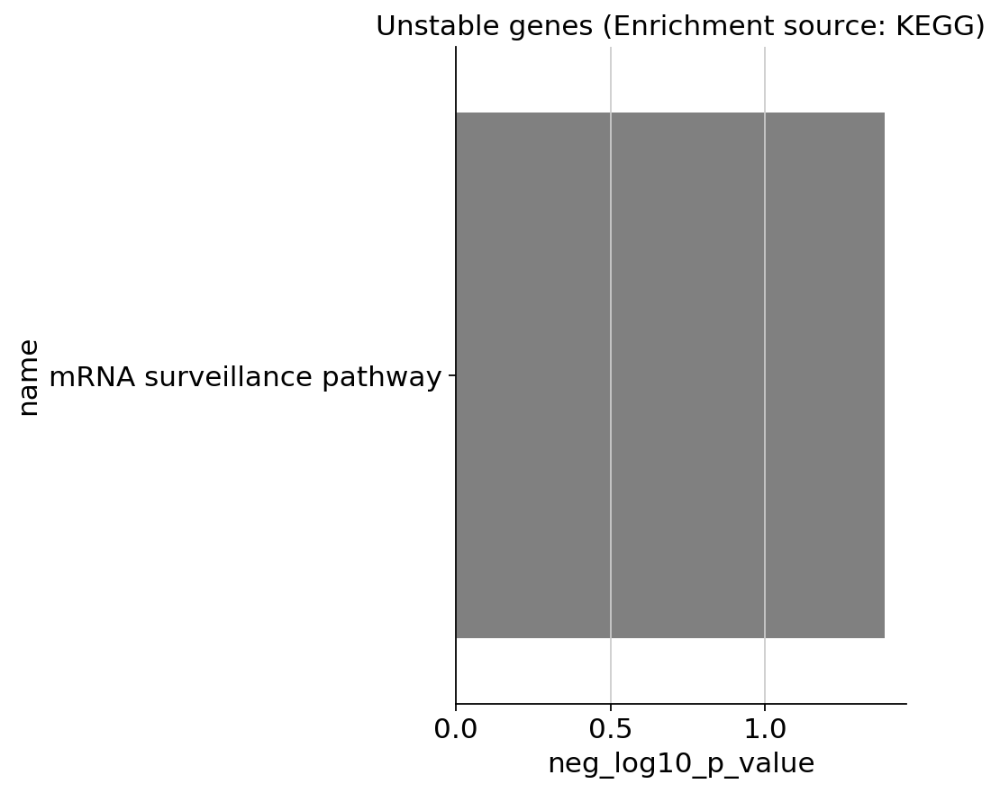

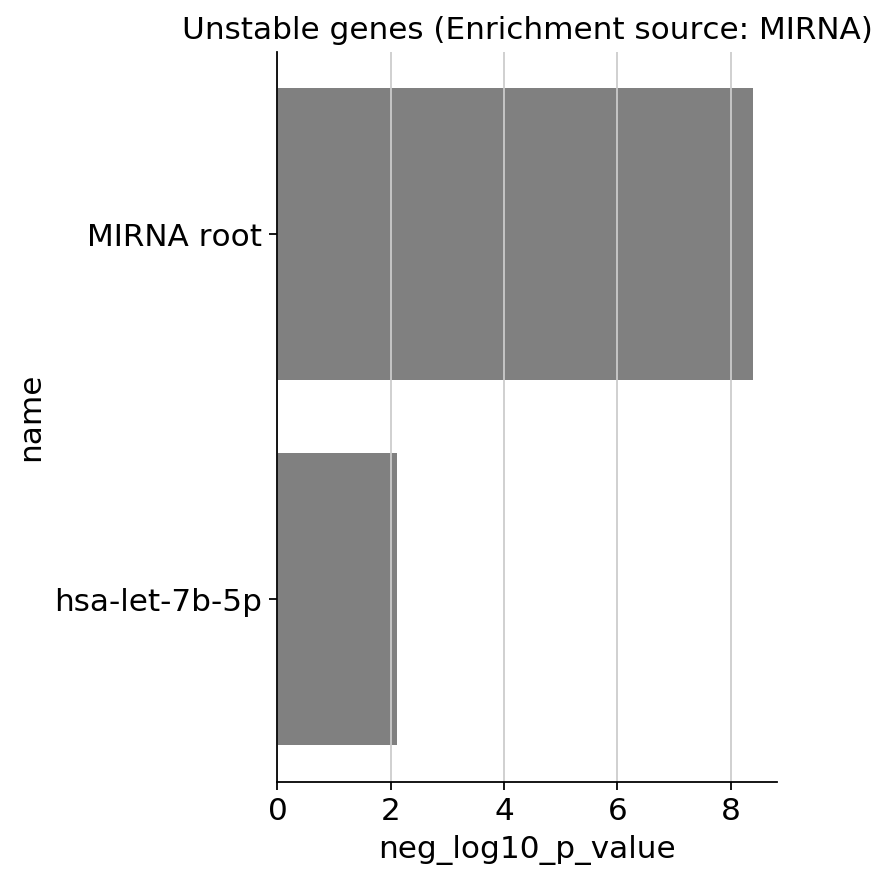

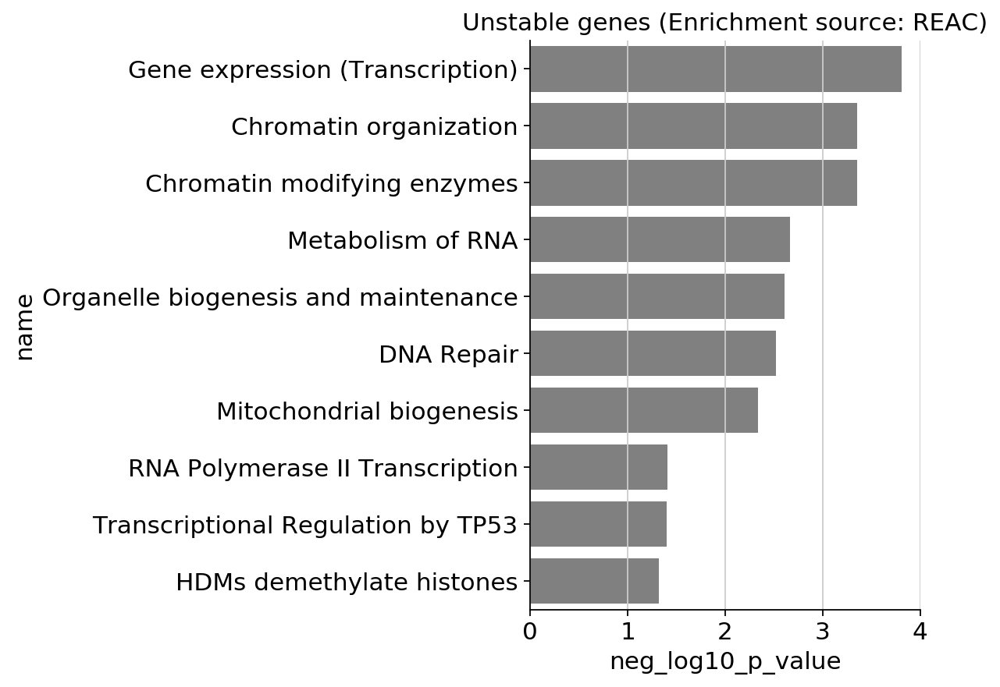

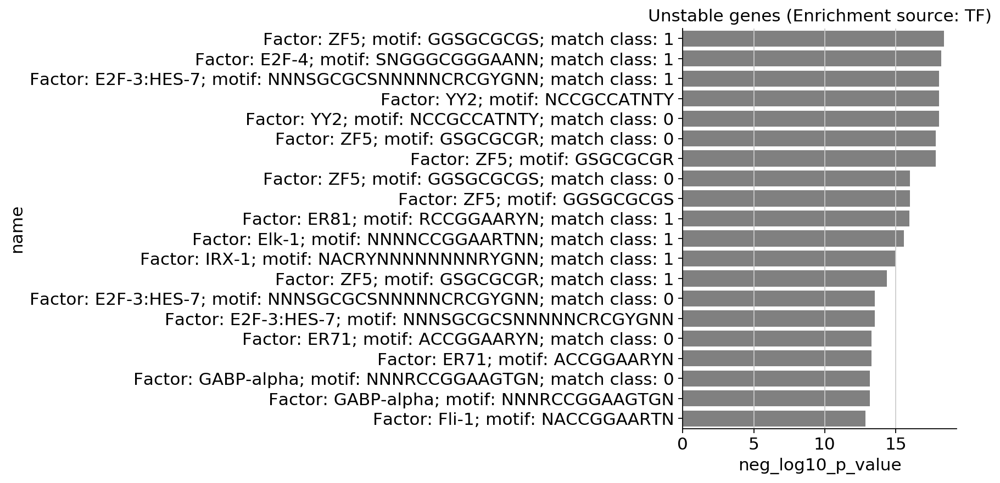

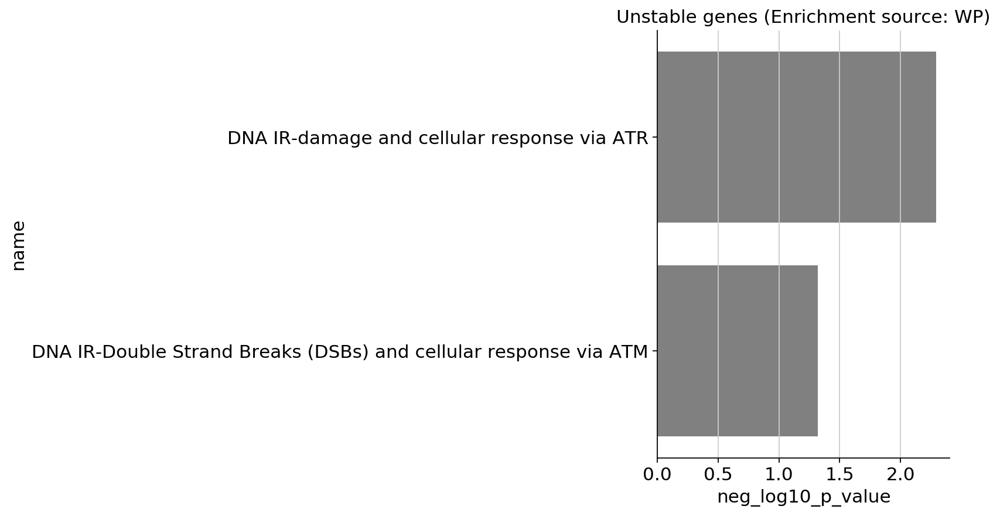

In [253]:
compartment_stability.plot_go_enrichment(groupby_source=True)

In [254]:
# unstable_go_only = compartment_stability.unstable_go[compartment_stability.unstable_go.source.str.contains('GO')]
# print(unstable_go_only.shape)
# unstable_go_only.head()

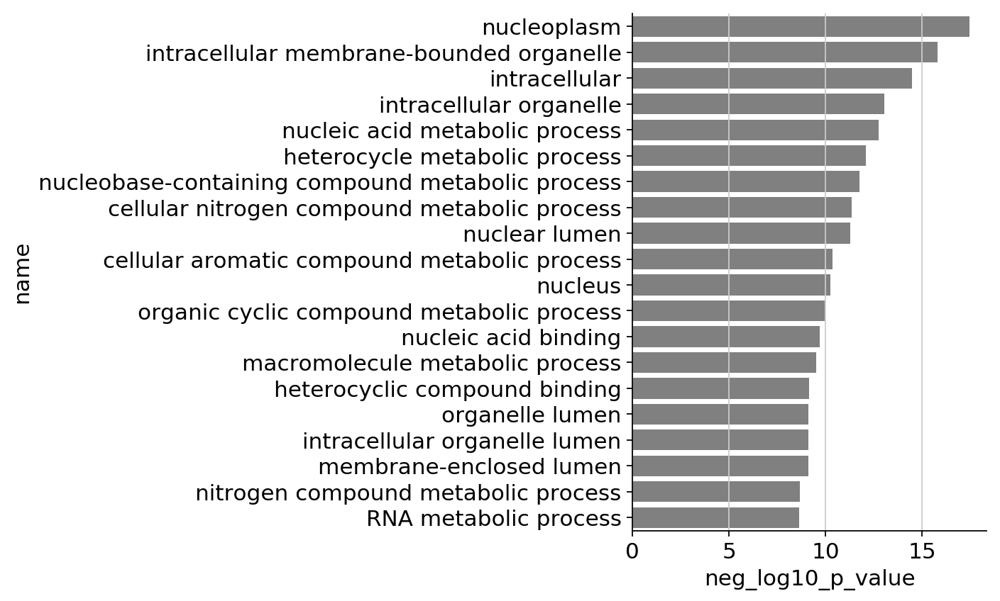

In [255]:
enrich.plot_go_enrichment(unstable_go_only)

In [127]:
v# compartment_stability.plot_fractions()

## Some asserts to double check the outputs are correct

In [146]:
compartment_stability.n_stable

8793

In [147]:
compartment_stability.n_unstable

2956

In [173]:
assert compartment_stability.n_genes == 11749
assert compartment_stability.n_stable == 8793
assert compartment_stability.n_unstable == 2956


## Do compartment primate enrichment

/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-22 11:39:22,395 INFO: Computing fraction cells expressing genes per compartment_group
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-22 11:39:22,397 INFO: Filtering adata for only narrow_group shared across all 3 species
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-22 11:39:22,401 INFO: Starting number of narrow_group: 64
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-22 11:39:22,565 INFO: After removing groups not in all species narrow_group: 22
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-05-22 11:39:22,636 INFO: After cell groups with too few cells in compartment_group: 5
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-withi

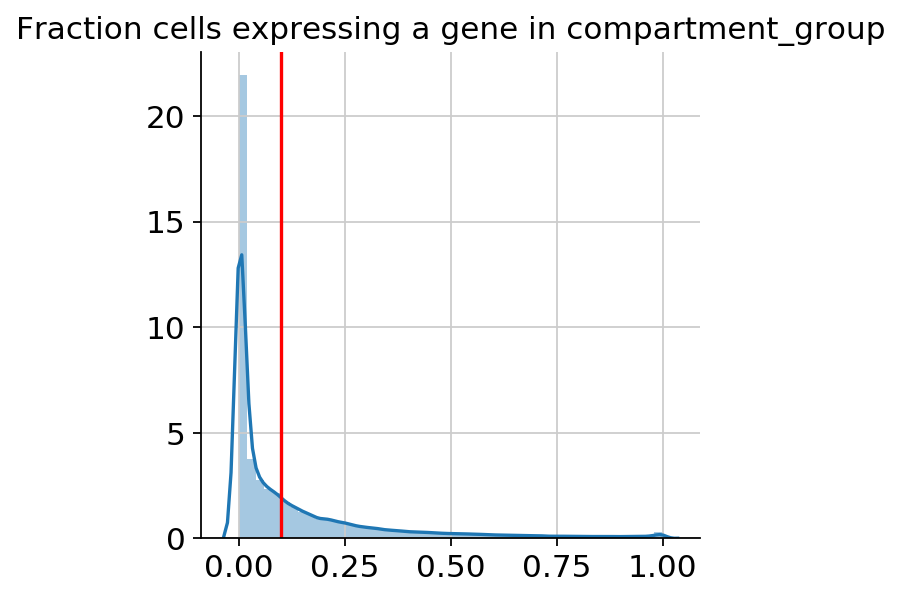

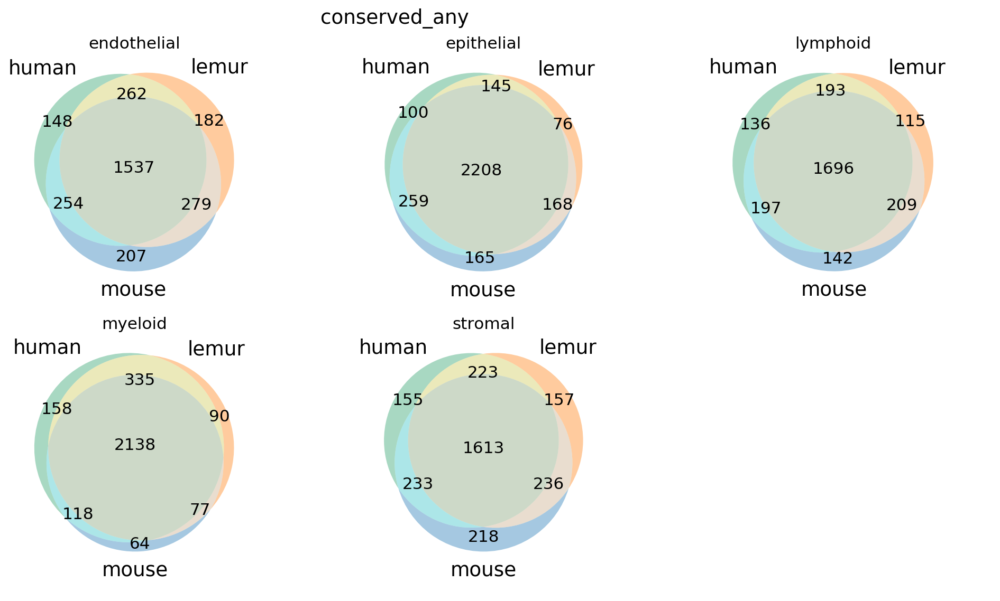

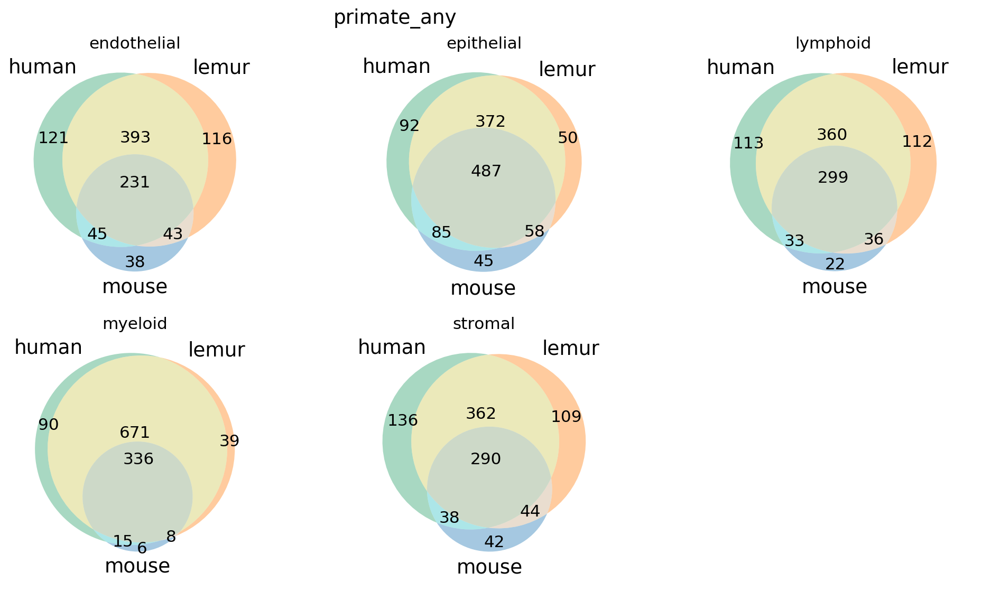

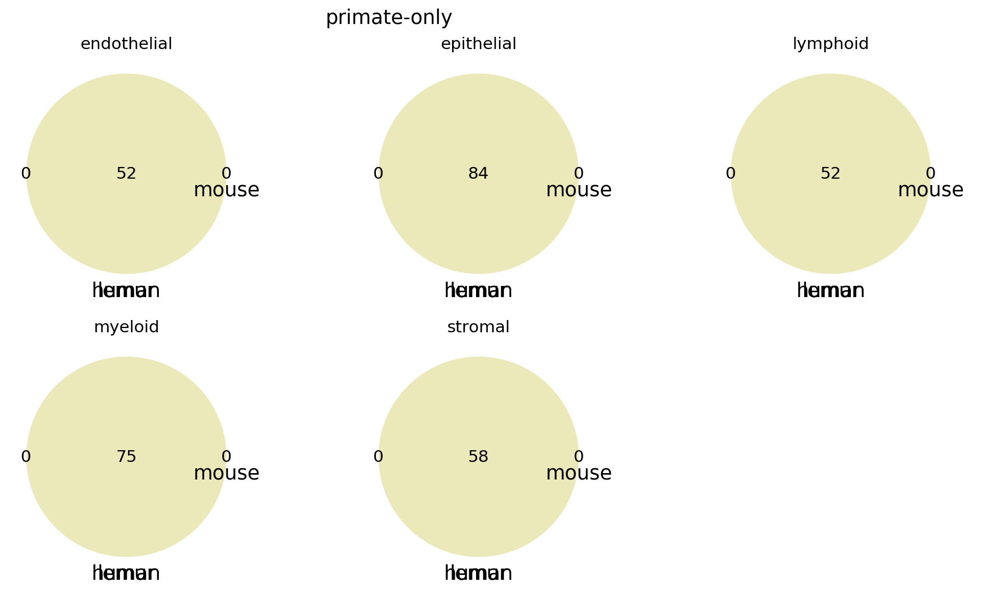

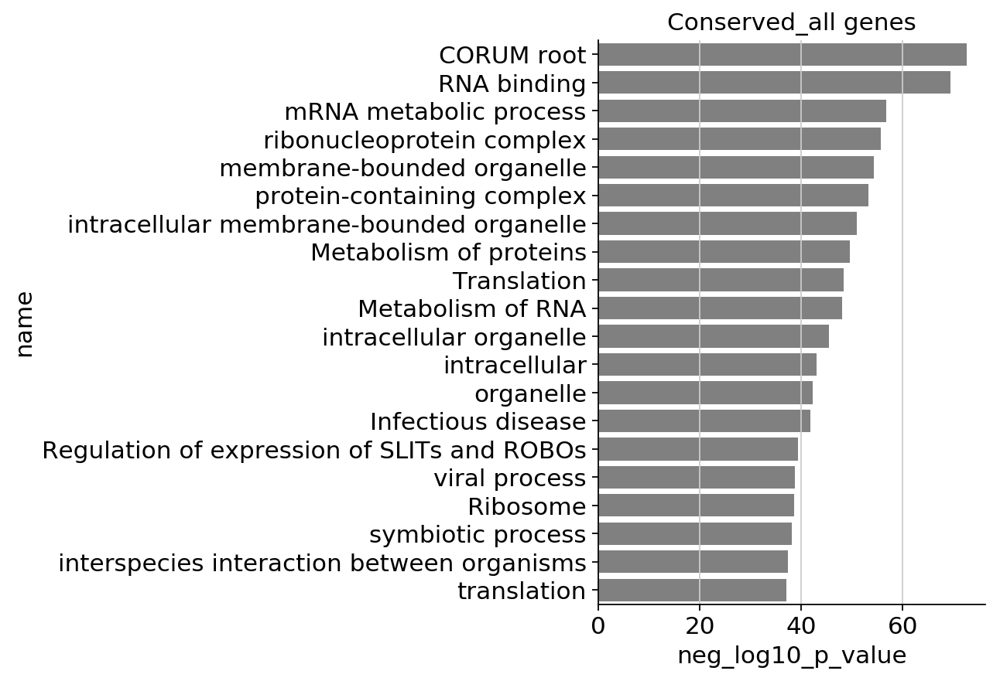

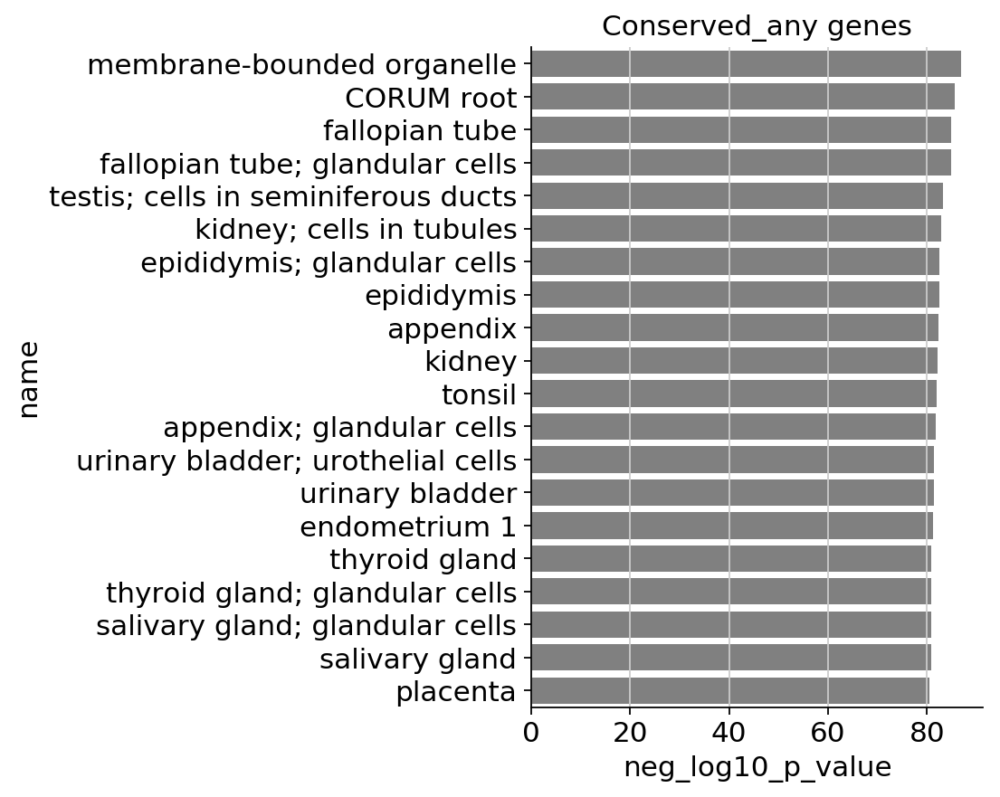

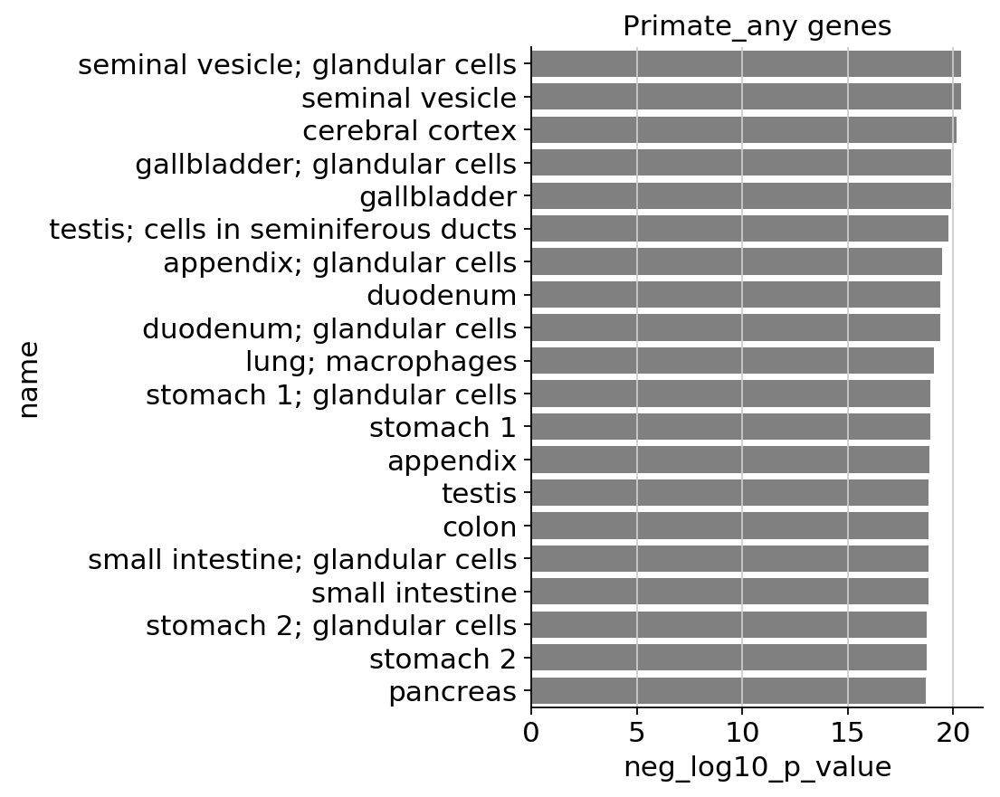

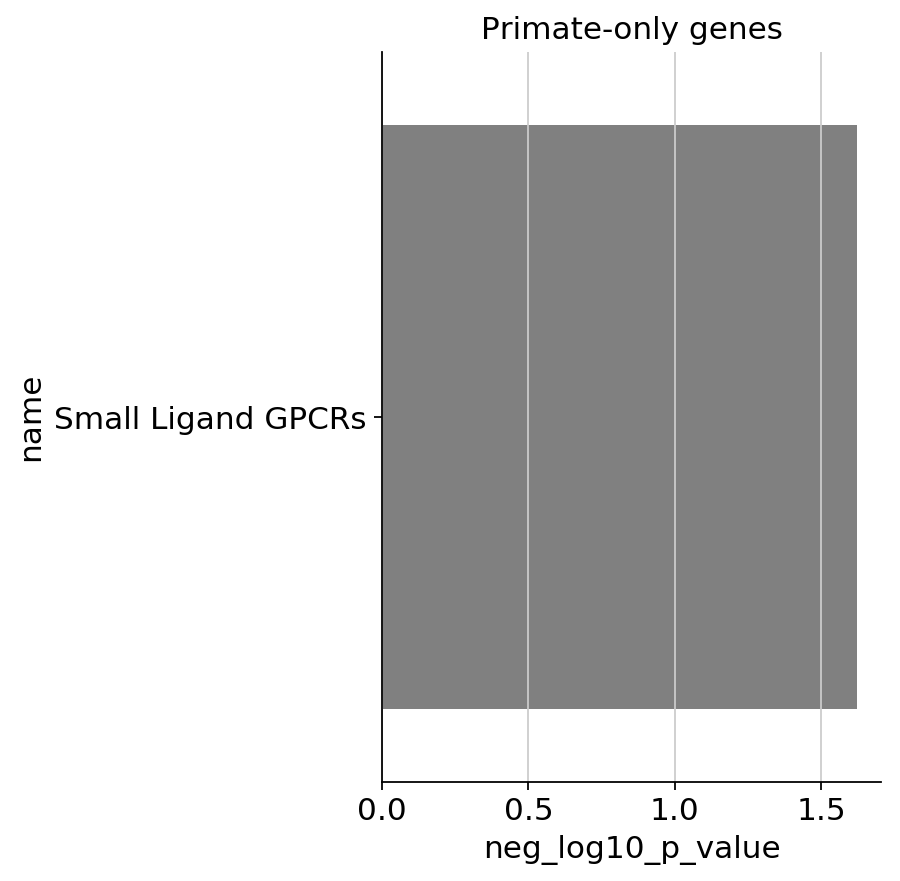

In [307]:
compartment_primate = binarized.BinarizedPrimateAnalyses(adata, groupby, species, 
                                              stable_genes=compartment_stability.stable_gene_names, debug=True)
compartment_primate.find_primate_enriched_genes()

In [308]:
3545 + 1337 + 3198 + 667

8747

### Venn diagrams of conserved vs primate

In [309]:
import matplotlib_venn

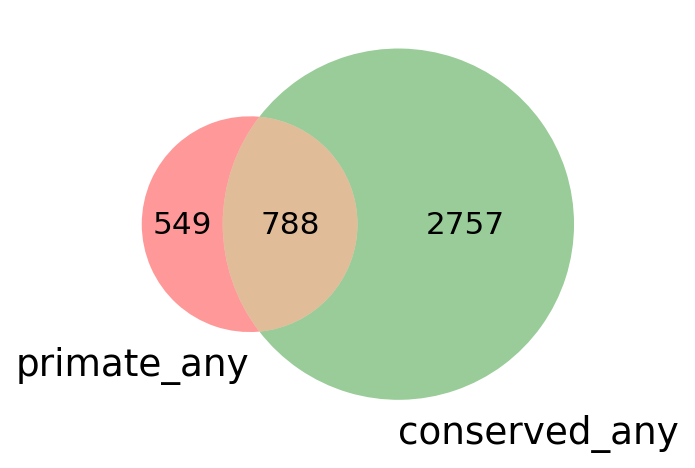

In [310]:
set_list = [set(compartment_primate.primate_any.index), set(compartment_primate.conserved_any.index)]
labels = ['primate_any', 'conserved_any']

matplotlib_venn.venn2(set_list, set_labels=labels)

In [311]:
has_mouse = compartment_primate.species_sharing_2d.applymap(lambda x: 'mouse' in x if isinstance(x, str) else x)
rows = has_mouse.any(axis=1)
mouse_any = compartment_primate.species_sharing_2d.loc[rows]
print(mouse_any.shape)
mouse_any.head()

(4897, 5)


compartment_group,endothelial,epithelial,lymphoid,myeloid,stromal
NOC2L,human,human-lemur-mouse,human-lemur-mouse,human-lemur-mouse,human
ISG15,human-lemur-mouse,human-lemur,human-lemur-mouse,human-lemur-mouse,human-lemur
TNFRSF18,lemur,NaN,human-lemur-mouse,NaN,NaN
SDF4,human-lemur-mouse,human-lemur-mouse,human-lemur-mouse,human-lemur-mouse,human-lemur-mouse
UBE2J2,human-mouse,human-mouse,human-mouse,human-mouse,human-mouse


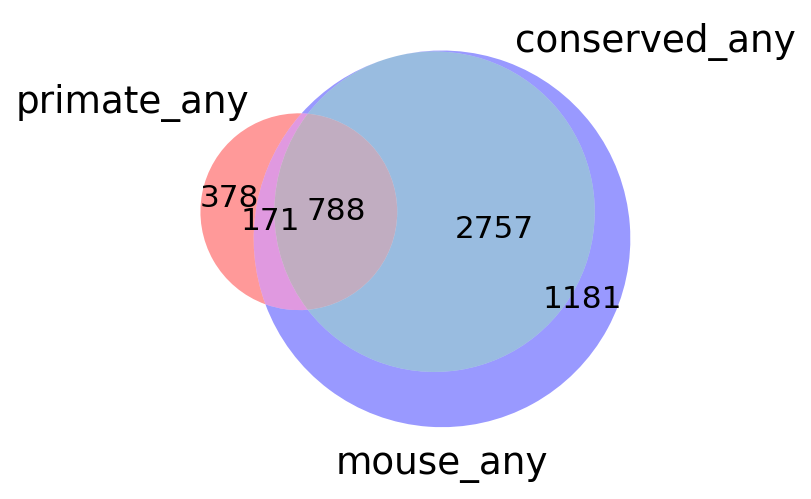

In [312]:
set_list = [set(compartment_primate.primate_any.index), set(compartment_primate.conserved_any.index), set(mouse_any.index)]
labels = ['primate_any', 'conserved_any', 'mouse_any']

matplotlib_venn.venn3(set_list, set_labels=labels)

In [313]:
len(compartment_primate.primate_any.index.intersection(compartment_primate.primate_all.index))

137

In [314]:
len(compartment_primate.primate_any.index.intersection(compartment_primate.conserved_any.index))

788

In [315]:
# compartment_primate.dotplot("HHIP")

In [316]:
rows = ((compartment_primate.species_sharing_2d == 'human-lemur') | compartment_primate.species_sharing_2d.isnull()).all(axis=1)
df = compartment_primate.species_sharing_2d.loc[rows]
df = df.dropna(how='all')
df

compartment_group,endothelial,epithelial,lymphoid,myeloid,stromal
TNFRSF25,NaN,NaN,human-lemur,NaN,NaN
ALPL,NaN,human-lemur,NaN,NaN,NaN
PTAFR,NaN,NaN,NaN,human-lemur,NaN
FAM167B,human-lemur,NaN,NaN,NaN,NaN
COL9A2,NaN,NaN,NaN,human-lemur,NaN
...,...,...,...,...,...
SHROOM4,human-lemur,NaN,NaN,NaN,NaN
GLA,human-lemur,human-lemur,human-lemur,human-lemur,human-lemur
TCEAL7,NaN,NaN,NaN,NaN,human-lemur
CD40LG,NaN,NaN,human-lemur,NaN,NaN


### Plot all-conserved or all-primate, groupby source

In [317]:
compartment_primate.do_go_enrichment(groupby_source=True)

### Do per-compartment enrichment, overall

In [318]:
# compartment_primate.do_per_group_enrichment()

### Do per-compartment enrichment, per-source

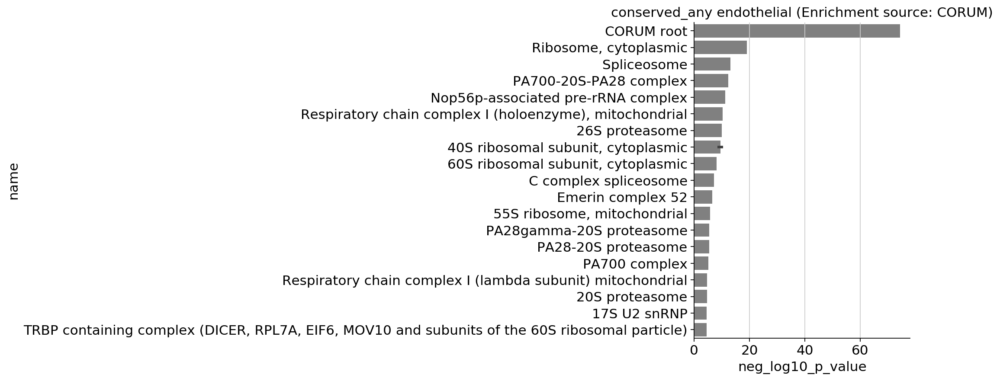

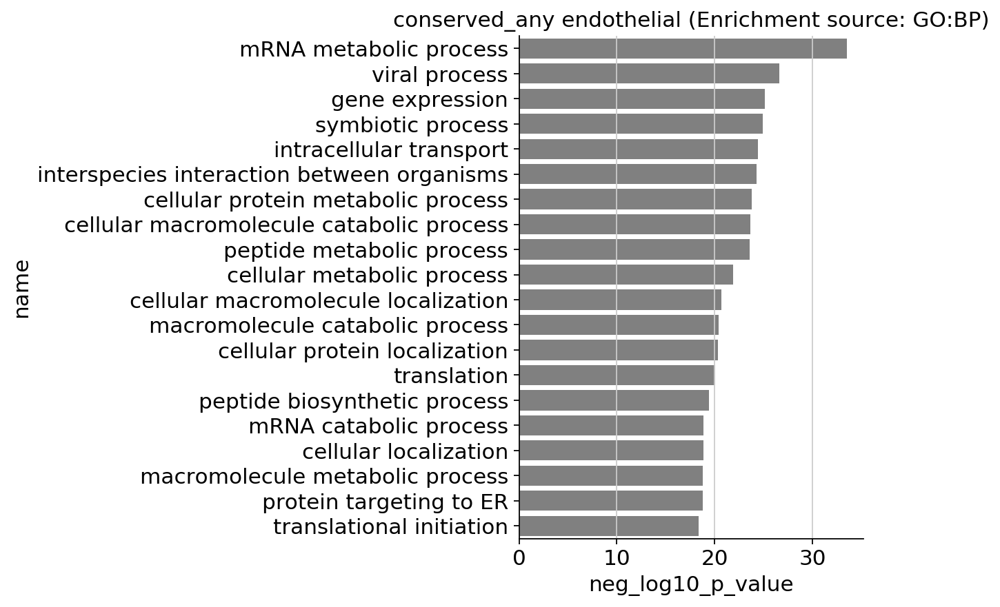

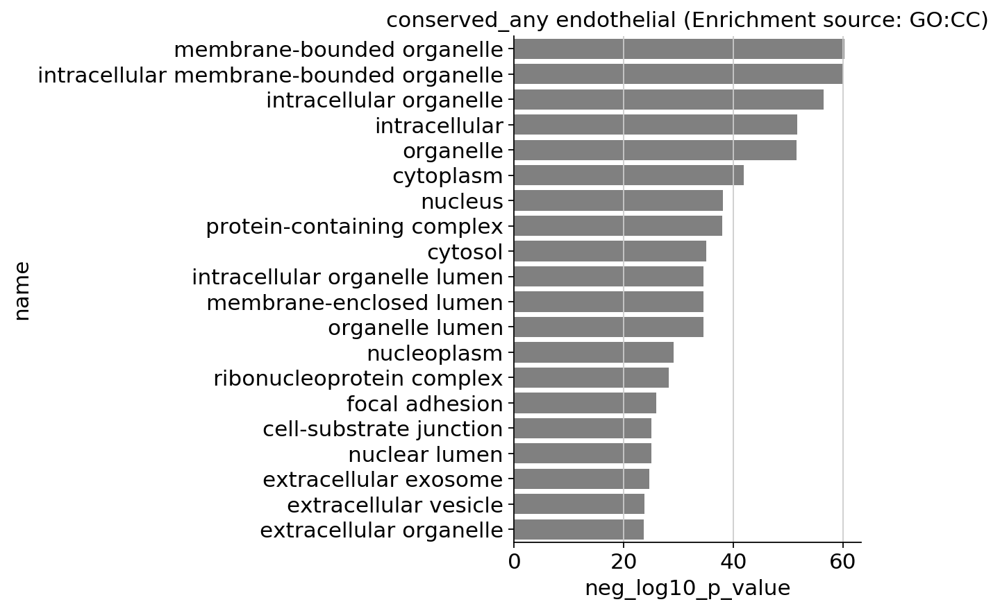

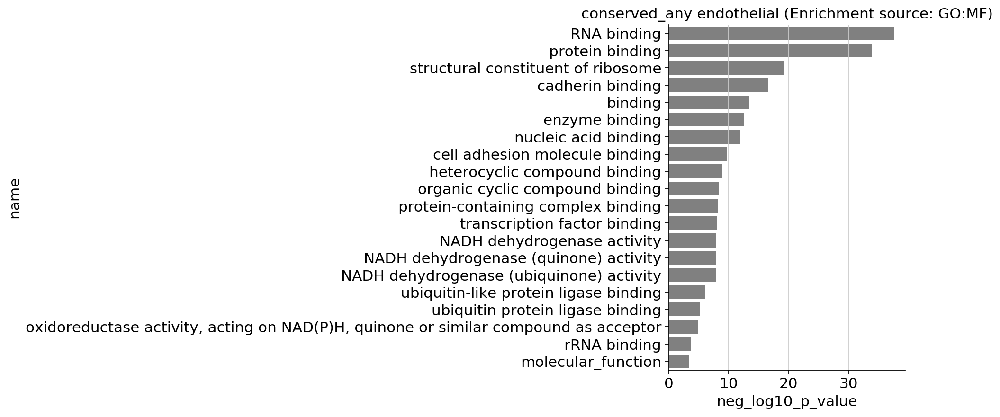

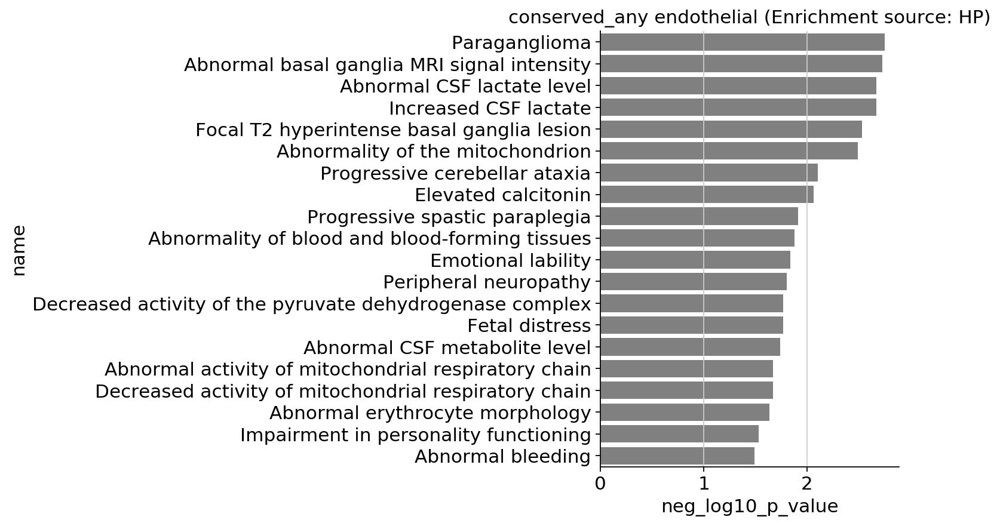

...

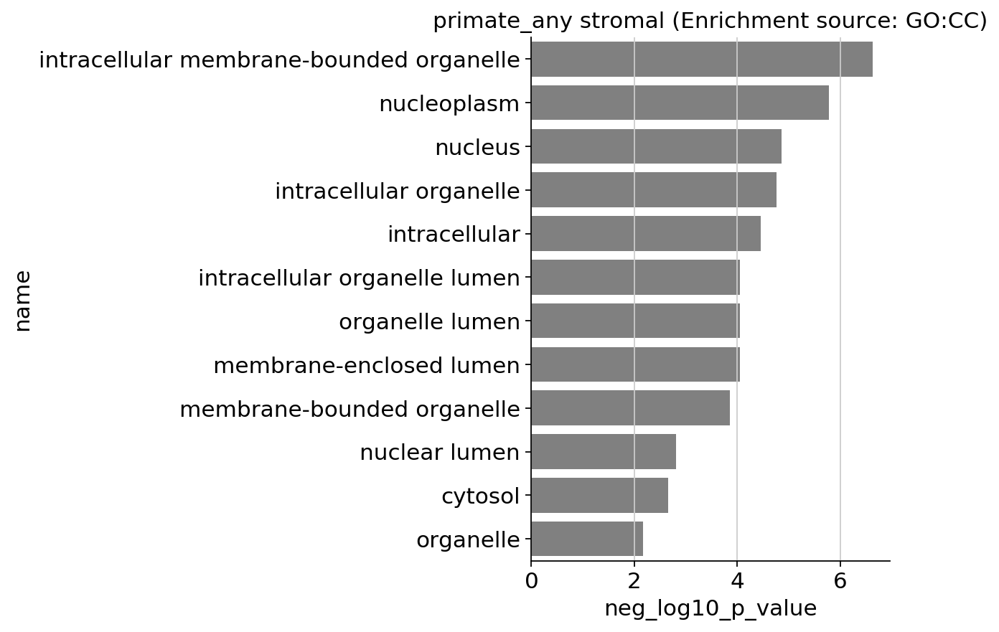

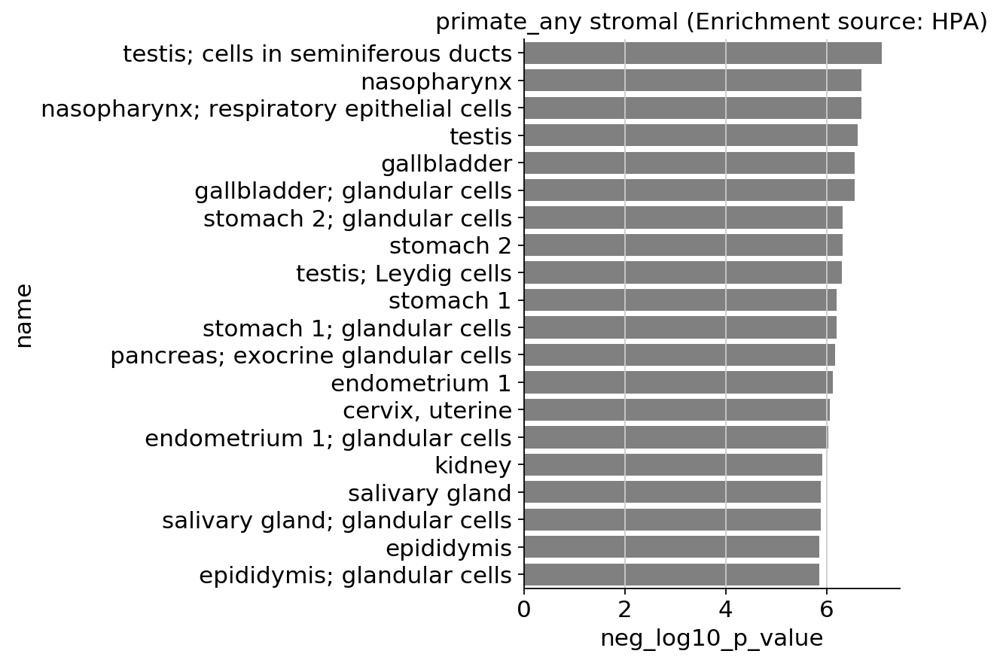

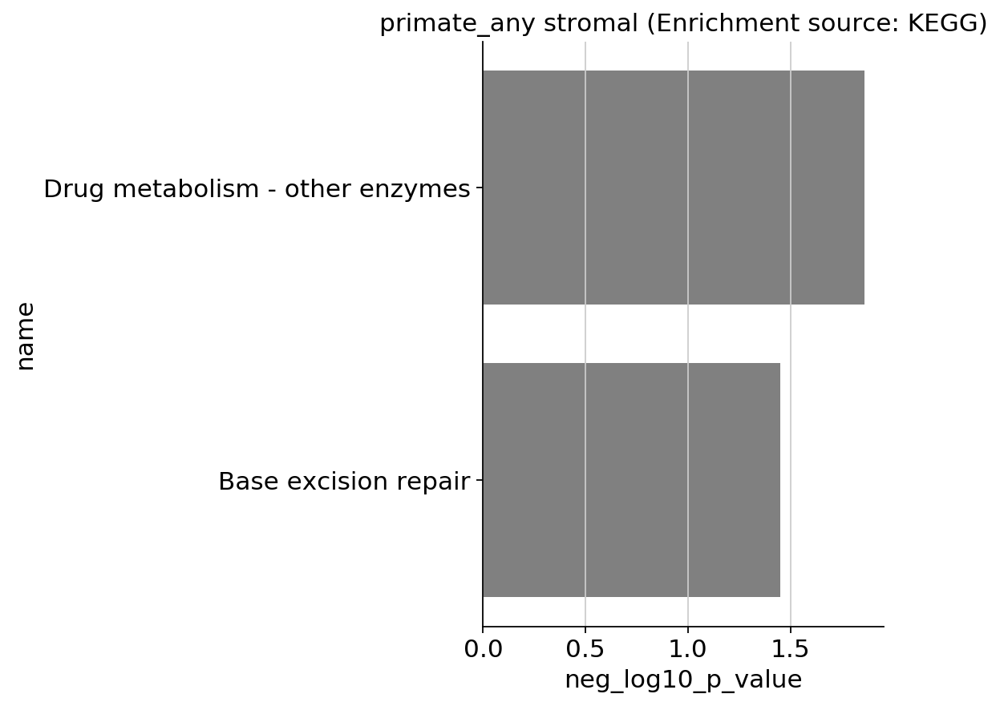

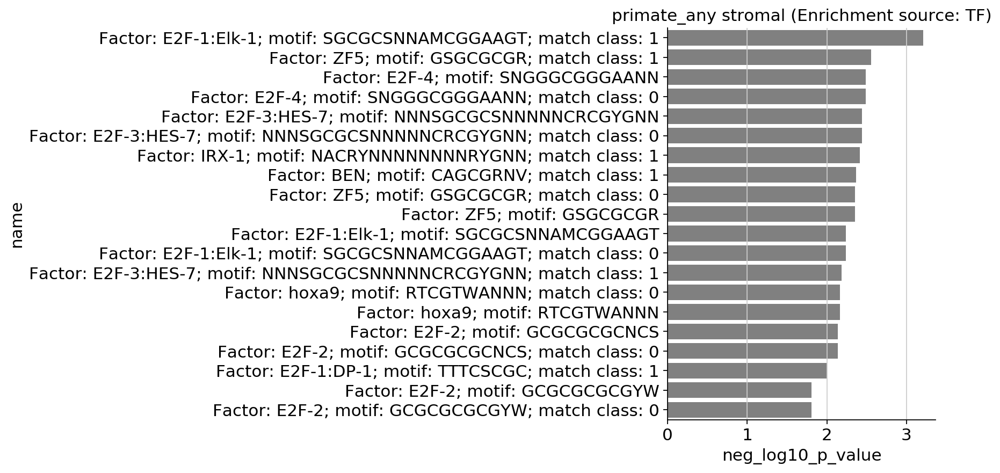

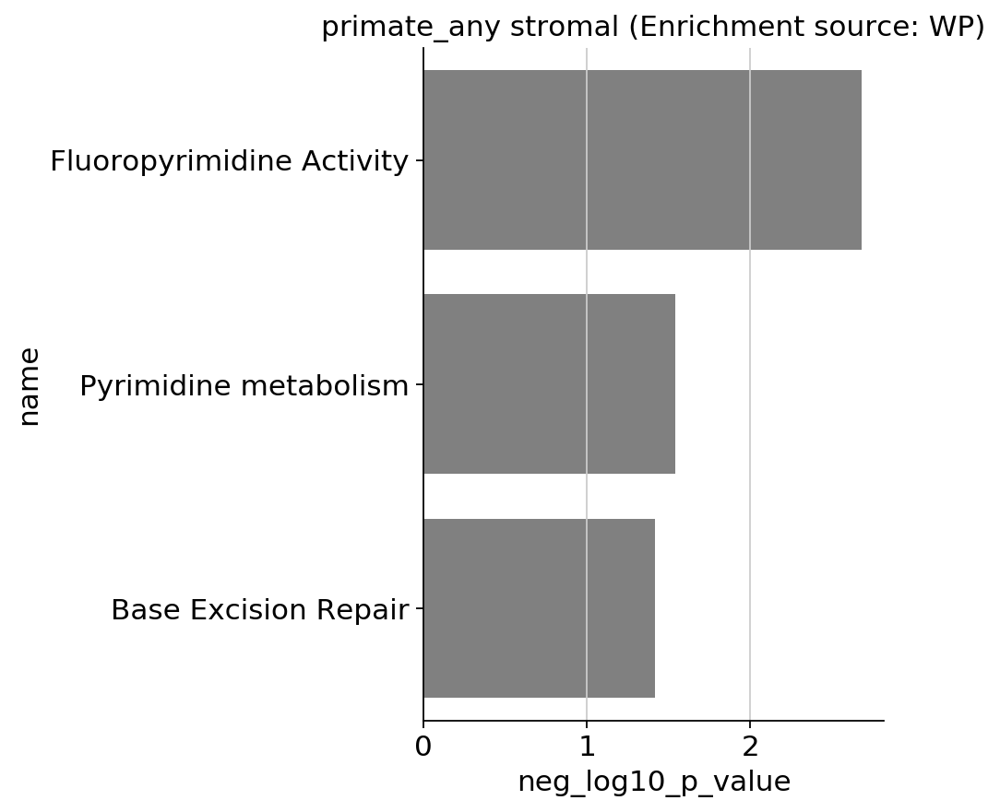

In [319]:
compartment_primate.do_per_group_enrichment(groupby_source=True)

## Do GeneRIF

In [347]:
compartment_primate.do_per_group_primate_generif()

/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:06:45,426 INFO: Querying human-lemur genes for endothelial


querying 1-393...done.
Finished.
76 input query terms found dup hits:
	[('ACSL3', 3), ('ADA', 3), ('AMZ2', 2), ('APEX1', 2), ('ARHGAP26', 5), ('ARRDC3', 3), ('BACE2', 3), 
1 input query terms found no hit:
	['TMEM173']


/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:06:49,932 INFO: Querying human-lemur genes for epithelial


(25222, 7)
querying 1-372...done.
Finished.
59 input query terms found dup hits:
	[('ADPGK', 3), ('ALG3', 3), ('AQP4', 3), ('B4GALT4', 3), ('BACE2', 3), ('BTG3', 5), ('C1GALT1', 9), 
4 input query terms found no hit:
	['ADPRHL2', 'C12orf49', 'HIST1H2BD', 'KIAA1324L']


/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:06:54,575 INFO: Querying human-lemur genes for lymphoid


(22872, 7)
querying 1-360...done.
Finished.
62 input query terms found dup hits:
	[('ADPGK', 3), ('ALG3', 3), ('AMZ2', 2), ('AOAH', 3), ('BTG3', 5), ('C1GALT1', 9), ('CDK6', 3), ('CE
3 input query terms found no hit:
	['ADPRHL2', 'C12orf49', 'CASC4']


/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:06:58,397 INFO: Querying human-lemur genes for myeloid


(11432, 7)
querying 1-671...done.
Finished.
106 input query terms found dup hits:
	[('ACSL3', 3), ('ADAMTSL4', 5), ('ADPGK', 3), ('ALG14', 3), ('ALG3', 3), ('ANPEP', 3), ('ARHGAP5', 3
10 input query terms found no hit:
	['ADPRHL2', 'C12orf49', 'C16orf58', 'CASC4', 'IMPAD1', 'KIAA0355', 'MARS', 'TMEM8A', 'WDR34', 'YARS'


/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:07:04,850 INFO: Querying human-lemur genes for stromal


(26942, 7)
querying 1-362...done.
Finished.
68 input query terms found dup hits:
	[('ACSL3', 3), ('AGT', 10), ('ALG3', 3), ('APEX1', 2), ('ARIH2', 2), ('BAIAP2', 3), ('BCAP29', 2), (
4 input query terms found no hit:
	['ADPRHL2', 'IMPAD1', 'TMEM173', 'WARS']


/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:07:09,286 INFO: Writing /home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species/binarized/binarized_expression__stable_genes__primate_any__compartment_group__generif.xlsx ...


(27897, 7)


/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:07:36,101 INFO: Done!
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:07:36,106 INFO: Writing /home/olga/googledrive/TabulaMicrocebus/data/cross-species/binarized/binarized_expression__stable_genes__primate_any__compartment_group__generif.xlsx ...
/home/olga/code/tabula-microcebus--olgabot/xspecies-lung-de-within-species/notebooks/binarized.py - 2020-06-03 15:08:06,629 INFO: Done!


In [320]:
compartment_primate.gene_lists.keys()

dict_keys(['background', 'conserved_all', 'conserved_any', 'primate_any', 'primate-only'])

In [ ]:
# compartment_primate.do_per_group_enrichment('conserved_any')

# GeneRIF

In [323]:
compartment_primate.primate_any

compartment_group,endothelial,epithelial,lymphoid,myeloid,stromal
A4GALT,human-mouse,human-lemur,NaN,human,human-mouse
AAK1,human-lemur-mouse,human-lemur-mouse,human-lemur-mouse,human-lemur,human-lemur-mouse
ABCA1,lemur,lemur-mouse,NaN,human-lemur,lemur-mouse
ABCA5,lemur,human,human,NaN,human-lemur
ABCA8,NaN,NaN,NaN,NaN,human-lemur
...,...,...,...,...,...
ZNF791,human-lemur,lemur,human-lemur,lemur,human-lemur
ZNFX1,human-lemur-mouse,human-lemur-mouse,human-lemur,human-lemur-mouse,human-mouse
ZNHIT3,human-mouse,human-mouse,human-lemur-mouse,human-lemur,human-mouse
ZRSR2,lemur-mouse,human-mouse,human-lemur,human-lemur,mouse


In [328]:
genes = compartment_primate.primate_any.query('myeloid == "human-lemur"').index.tolist()
print(len(genes))
genes[:5]

671


['AAK1', 'ABCA1', 'ABCD3', 'ABHD13', 'ABHD14B']

In [329]:
import mygene

mg = mygene.MyGeneInfo()

mygene_results = mg.querymany(genes, 
                              # Only search the gene summaries
                              scopes='symbol,name', 
                              
                              # Fields to return. Available fields: https://docs.mygene.info/en/latest/doc/data.html#available-fields
                              # This is the defaults ("symbol,name,taxid,entrezgene,ensemblgene") in the 
                              # live API (https://mygene.info/v3/api#/query/get_query) plus "summary"
                              fields="symbol,name,summary,generif", 
                              
                              # By default, it will not return duplicated terms, but since we're searching the summaries
                              # for a generic word, then need to return all
                              returnall=True, 
                              
                              # Only search human
                              species='human')

querying 1-671...done.
Finished.
106 input query terms found dup hits:
	[('ACSL3', 3), ('ADAMTSL4', 5), ('ADPGK', 3), ('ALG14', 3), ('ALG3', 3), ('ANPEP', 3), ('ARHGAP5', 3
10 input query terms found no hit:
	['ADPRHL2', 'C12orf49', 'C16orf58', 'CASC4', 'IMPAD1', 'KIAA0355', 'MARS', 'TMEM8A', 'WDR34', 'YARS'


In [352]:
from sklearn.metrics import mutual_info_score, normalized_mutual_info_score

In [351]:
mutual_info_score(
    [1, 1, 1, 1, 1], [1, 1, 0, 1, 0])

-1.1102230246251565e-16

In [353]:
normalized_mutual_info_score(
    [1, 1, 1, 1, 1], [1, 1, 0, 1, 0])

-3.2992682862654953e-16

In [354]:
# mygene_results['dup']

In [331]:
mygene_results_out = mygene_results['out']
len(mygene_results_out)

963

In [334]:
mygene_results_out[0]

{'query': 'AAK1',
 '_id': '22848',
 '_score': 87.61535,
 'generif': [{'pubmed': 17494869,
   'text': 'These observations suggest that AAK1 functions at multiple steps of the endosomal pathway by regulating transferrin internalization and its rapid recycling back to the plasma membrane from early/sorting endosome.'},
  {'pubmed': 19772629,
   'text': 'Observational study, meta-analysis, and genome-wide association study of gene-disease association. (HuGE Navigator)'},
  {'pubmed': 20379614,
   'text': 'Clinical trial of gene-disease association and gene-environment interaction. (HuGE Navigator)'},
  {'pubmed': 21464124,
   'text': 'AAK1 increases the localization of activated Notch to Rab5-positive endocytic vesicles, while AAK1 depletion or overexpression of Numb, an inhibitor of the pathway, interferes with this localization.'},
  {'pubmed': 25653444,
   'text': 'AAK1 and GAK are critical regulators of HCV entry that function in part by activating EGFR, AP2M1, and NUMB, and as the mol

In [333]:
pd.DataFrame(mygene_results_out[0]['generif'])

,pubmed,text
0,17494869,These observations suggest that AAK1 functions...
1,19772629,"Observational study, meta-analysis, and genome..."
2,20379614,Clinical trial of gene-disease association and...
3,21464124,AAK1 increases the localization of activated N...
4,25653444,AAK1 and GAK are critical regulators of HCV en...
5,25852190,Two of these kinases that were classified as r...
6,26853940,Results present the first structures of AAK1 a...
7,30605688,Author show that AAK1 promotes clearance of LR...


In [335]:
pubmed_template = 'https://pubmed.ncbi.nlm.nih.gov/{pubmed_id}/'

def assign(df, key, result):
    try:
        df[key] = result[key]
    except KeyError:
        pass
    return df

result_keys = 'query', 'name', 'summary', 'symbol'

dfs = []

for result in mygene_results_out:
    try:
        df = pd.DataFrame(result['generif'])
        df['pubmed_url'] = df.pubmed.map(lambda x: pubmed_template.format(pubmed_id=x))
    except KeyError:
        df = pd.DataFrame({'pubmed': [None], 'text': [None]})
    
    for key in result_keys:
        df = assign(df, key, result)
    dfs.append(df)
generif_df = pd.concat(dfs, ignore_index=True)
print(generif_df.shape)
generif_df.head()

In [343]:
generif_df.query('query != symbol')

,name,pubmed,pubmed_url,query,summary,symbol,text
754,ACSL3 antisense RNA 1,None,NaN,ACSL3,NaN,ACSL3-AS1,None
755,ACSL3 antisense RNA 1,None,NaN,ACSL3,NaN,ACSL3-AS1,None
861,ADAMTSL4 antisense RNA 1,None,NaN,ADAMTSL4,NaN,ADAMTSL4-AS1,None
862,ADAMTSL4 antisense RNA 2,None,NaN,ADAMTSL4,NaN,ADAMTSL4-AS2,None
863,ADAMTSL4 antisense RNA 2,None,NaN,ADAMTSL4,NaN,ADAMTSL4-AS2,None
...,...,...,...,...,...,...,...
26221,NaN,None,NaN,WDR34,NaN,NaN,None
26827,NaN,None,NaN,YARS,NaN,NaN,None
26927,ZNF664-RFLNA readthrough,None,NaN,ZNF664,This locus represents naturally occurring read...,ZNF664-RFLNA,None
26940,ZRSR2 pseudogene 1,28676493,https://pubmed.ncbi.nlm.nih.gov/28676493/,ZRSR2,NaN,ZRSR2P1,Confounding ZRSR1 pseudogene led to an erroneo...


In [338]:
result

{'query': 'ABHD14B',
 '_id': '84836',
 '_score': 87.676865,
 'name': 'abhydrolase domain containing 14B',
 'symbol': 'ABHD14B'}

# loook at primate only genes

In [ ]:
primate_only= narrow_primate.primate.groupby(level=0, axis=1).apply(lambda x: x[x == 'human-lemur'])
primate_only

group_enrichments = {}

background = list(narrow_primate.gene_lists['background'])

for group, series in primate_only.iteritems():
    gene_list = list(series.dropna().index)
    
    group_enrichment = enrich.do_go_enrichment(
                gene_list, background=background)
    
    group_enrichments[group] = group_enrichment
    if not group_enrichment.empty:
        enrich.plot_go_enrichment(group_enrichment)
        ax = plt.gca()
        ax.set(title=group)

In [ ]:
narrow_primate = a

In [98]:
narrow_stability.group_fractions

SAMD11     NOC2L  \
species_batch narrow_group                                                 
human         Adventitial Fibroblast                  0.186047  0.151163   
              Airway Smooth Muscle and Myofibroblast  0.066421  0.197417   
              Alveolar Epithelial Type 2              0.002043  0.182083   
              Alveolar Fibroblast                     0.060317  0.114286   
              B cell                                  0.000000  0.083333   
...                                                        ...       ...   
mouse         Plasma                                  0.023810  0.214286   
              Plasmacytoid Dendritic                  0.000000  0.150685   
              Proliferating Macrophage                0.000000  0.393617   
              Proliferating NK/T                      0.000000  0.288288   
              Vein                                    0.000000  0.078512   

                                                        KLHL17     ISG15  \
species_batch narrow_group                                                 
human         Adventitial Fibroblast                  0.002907  0.200581   
              Airway Smooth Muscle and Myofibroblast  0.009225  0.315498   
              Alveolar Epithelial Type 2              0.010797  0.121973   
              Alveolar Fibroblast                     0.006349  0.104762   
              B cell                                  0.041667  0.375000   
...                                                        ...       ...   
mouse         Plasma                                  0.000000  0.214286   
              Plasmacytoid Dendritic                  0.013699  0.150685   
              Proliferating Macrophage                0.000000  0.042553   
              Proliferating NK/T                      0.009009  0.261261   
              Vein                                    0.008264  0.367769   

                                                          AGRN  C1orf159  \
species_batch narrow_group                                                 
human         Adventitial Fibroblast                  0.026163  0.014535   
              Airway Smooth Muscle and Myofibroblast  0.029520  0.018450   
              Alveolar Epithelial Type 2              0.140648  0.040268   
              Alveolar Fibroblast                     0.031746  0.012698   
              B cell                                  0.000000  0.000000   
...                                                        ...       ...   
mouse         Plasma                                  0.023810  0.023810   
              Plasmacytoid Dendritic                  0.000000  0.000000   
              Proliferating Macrophage                0.010638  0.063830   
              Proliferating NK/T                      0.018018  0.081081   
              Vein                                    0.157025  0.012397   

                                                        TTLL10  TNFRSF18  \
species_batch narrow_group                                                 
human         Adventitial Fibroblast                  0.000000  0.000000   
              Airway Smooth Muscle and Myofibroblast  0.000000  0.001845   
              Alveolar Epithelial Type 2              0.004085  0.002626   
              Alveolar Fibroblast                     0.000000  0.000000   
              B cell                                  0.000000  0.166667   
...                                                        ...       ...   
mouse         Plasma                                  0.000000  0.190476   
              Plasmacytoid Dendritic                  0.000000  0.150685   
              Proliferating Macrophage                0.000000  0.053191   
              Proliferating NK/T                      0.000000  0.558559   
              Vein                                    0.000000  0.012397   

                                                       TNFRSF4      SDF4  \
species_batch narrow_gro

In [6]:
ls -lha $h5ad

-rw-rw-r-- 1 olga czb 731M May 18 21:46 /home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species/concatenated__human-lung--lemur-lung--mouse-lung__10x__one2one_orthologs__unified_compartments__bbknn.h5ad
